## Library Imports

In [2]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
from sklearn.ensemble import IsolationForest
from prophet import Prophet
from sklearn.preprocessing import RobustScaler
import xgboost as xgb
from xgboost import XGBRegressor
from pmdarima import auto_arima
import plotly.express as px
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split, RandomizedSearchCV

In [3]:
import warnings
warnings.filterwarnings("ignore")

## Load Data

In [5]:
# Load the dataset
df = pd.read_csv('GlobalWeatherRepository.csv')

In [6]:
# Preview the data
df.head()

,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45,23.0,73.4,Sunny,...,10.4,18.4,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55
3,Andorra,Andorra La Vella,42.50,1.52,Europe/Andorra,1715849100,2024-05-16 10:45,6.3,43.3,Light drizzle,...,0.7,0.9,1,1,06:31 AM,09:11 PM,02:12 PM,03:31 AM,Waxing Gibbous,55
4,Angola,Luanda,-8.84,13.23,Africa/Luanda,1715849100,2024-05-16 09:45,26.0,78.8,Partly cloudy,...,183.4,262.3,5,10,06:12 AM,05:55 PM,01:17 PM,12:38 AM,Waxing Gibbous,55


In [7]:
# Describe the data
df.describe()

,latitude,longitude,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,moon_illumination
count,62558.000000,62558.000000,6.255800e+04,62558.000000,62558.000000,62558.000000,62558.000000,62558.00000,62558.000000,62558.000000,...,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000,62558.000000
mean,19.135102,22.179739,1.729789e+09,22.114984,71.808573,8.289319,13.344247,168.77317,1014.158749,29.947492,...,19.076479,528.699723,63.645083,15.219793,11.443068,25.700084,51.932406,1.736437,2.730043,48.911314
std,24.475027,65.818865,8.076019e+06,9.597657,17.275580,9.104434,14.650297,103.72881,13.330807,0.393639,...,16.521902,929.273599,35.900121,26.369751,47.915557,44.232769,159.726132,0.993934,2.603642,35.071190
min,-41.300000,-175.200000,1.715849e+09,-24.900000,-12.800000,2.200000,3.600000,1.00000,947.000000,27.960000,...,3.600000,-9999.000000,0.000000,0.000000,-9999.000000,0.185000,-1848.150000,1.000000,1.000000,0.000000
25%,3.750000,-6.836100,1.722861e+09,16.500000,61.800000,4.000000,6.500000,80.00000,1010.000000,29.830000,...,10.800000,227.550000,39.700000,0.925000,0.740000,5.900000,9.065000,1.000000,1.000000,14.000000
50%,17.250000,23.316700,1.729848e+09,24.900000,76.900000,6.900000,11.200000,160.00000,1013.000000,29.920000,...,16.600000,329.300000,61.000000,3.515000,2.400000,13.875000,21.090000,1.000000,2.000000,48.000000
75%,40.400000,50.580000,1.736765e+09,28.400000,83.100000,11.400000,18.400000,256.00000,1018.000000,30.050000,...,25.300000,510.600000,83.000000,16.800000,9.065000,30.155000,46.250000,2.000000,3.000000,83.000000
max,64.150000,179.220000,1.743671e+09,49.200000,120.600000,1841.200000,2963.200000,360.00000,3006.000000,88.770000,...,2970.400000,38879.398000,480.700000,427.700000,521.330000,1614.100000,6037.290000,6.000000,10.000000,100.000000


## Data Cleaning and Preprocessing

In [9]:
# Check missing values
missing = df.isnull().sum()
print(missing)

country                         0
location_name                   0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
last_updated                    0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           0
visibility_km                   0
visibility_miles                0
uv_index                        0
gust_mph                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Ni

In [10]:
# Drop columns with too many missing values or fill them
# df = df.dropna(thresh=len(df)*0.5, axis=1)  # drop columns with >50% missing
# df = df.fillna(method='ffill')  # forward fill for time series

In [11]:
# Count duplicates
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


In [12]:
# # Data Info
# df.info()

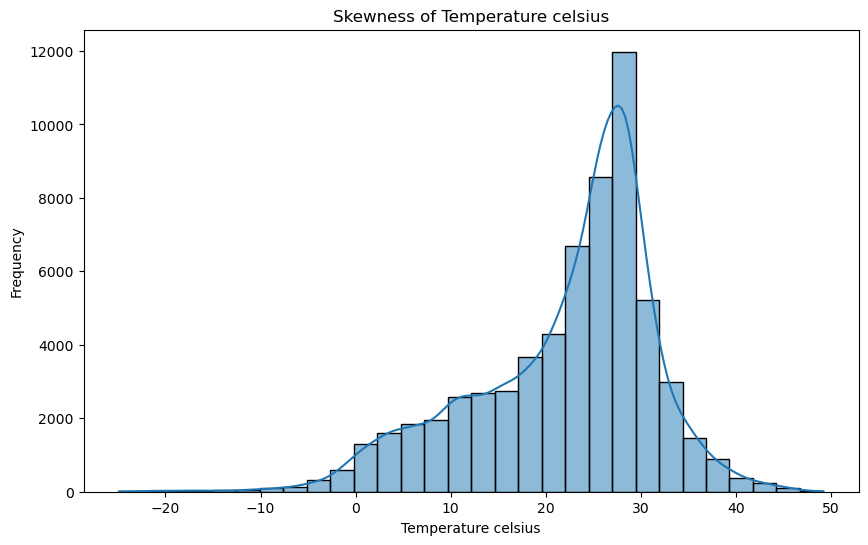

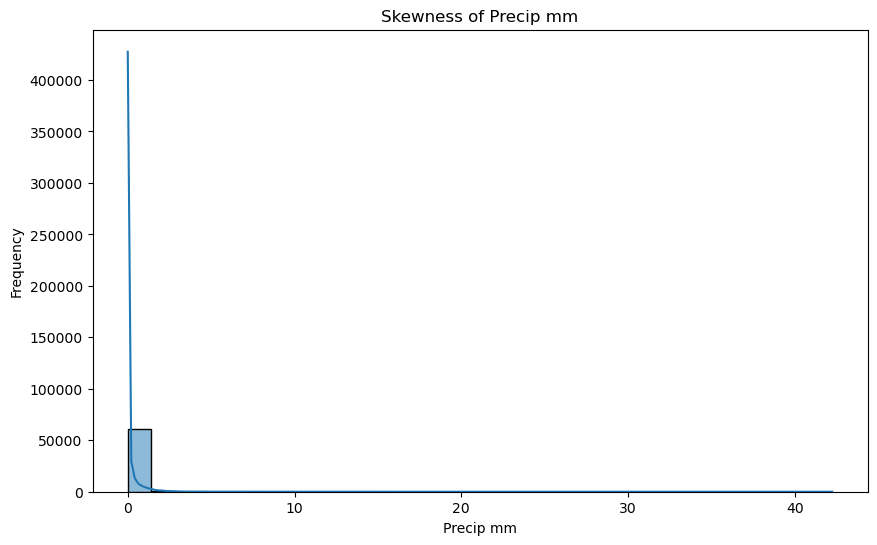

In [13]:
# List of columns to visualize 
columns_to_visualize = ['temperature_celsius', 'precip_mm']

# Loop through each column and plot its distribution
for column in columns_to_visualize:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[column], kde=True, bins=30, edgecolor='k')
    plt.title(f'Skewness of {column.replace("_", " ").capitalize()}')
    plt.xlabel(column.replace("_", " ").capitalize())
    plt.ylabel('Frequency')
    plt.show()

In [14]:
# def clip_outliers(df, column, factor=1.5):
#     Q1 = df[column].quantile(0.25)
#     Q3 = df[column].quantile(0.75)
#     IQR = Q3 - Q1
#     lower = Q1 - factor * IQR
#     upper = Q3 + factor * IQR
#     df[column] = df[column].clip(lower, upper)
#     return df

In [15]:
# # Apply to specific columns
# for col in ['temperature_celsius', 'precip_mm']:
#     df = clip_outliers(df, col)

In [16]:
# Handle outliers using Isolation Forest
iso = IsolationForest(contamination=0.01)
outliers = iso.fit_predict(df.select_dtypes(include=[np.number]))
df['outlier'] = outliers

In [17]:
# Filter out outliers
df = df[df['outlier'] != -1]
df.drop(columns='outlier', inplace=True)

In [18]:
# Data Info
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 61932 entries, 0 to 62557
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   country                       61932 non-null  object 
 1   location_name                 61932 non-null  object 
 2   latitude                      61932 non-null  float64
 3   longitude                     61932 non-null  float64
 4   timezone                      61932 non-null  object 
 5   last_updated_epoch            61932 non-null  int64  
 6   last_updated                  61932 non-null  object 
 7   temperature_celsius           61932 non-null  float64
 8   temperature_fahrenheit        61932 non-null  float64
 9   condition_text                61932 non-null  object 
 10  wind_mph                      61932 non-null  float64
 11  wind_kph                      61932 non-null  float64
 12  wind_degree                   61932 non-null  int64  
 13  wind_d

In [19]:
# # Normalize
# scaler = RobustScaler()
# df[['temperature_celsius', 'precip_mm']] = scaler.fit_transform(df[['temperature_celsius', 'precip_mm']])

In [20]:
# # Normalize numerical featuresscaler = MinMaxScaler()
# df[['temperature_celsius', 'precip_mm']] = scaler.fit_transform(df[['temperature_celsius', 'precip_mm']])

## Exploratory Data Analysis 

In [22]:
# Convert date column
df['last_updated'] = pd.to_datetime(df['last_updated'])

In [23]:
# Sort chronologically
df = df.sort_values('last_updated') 

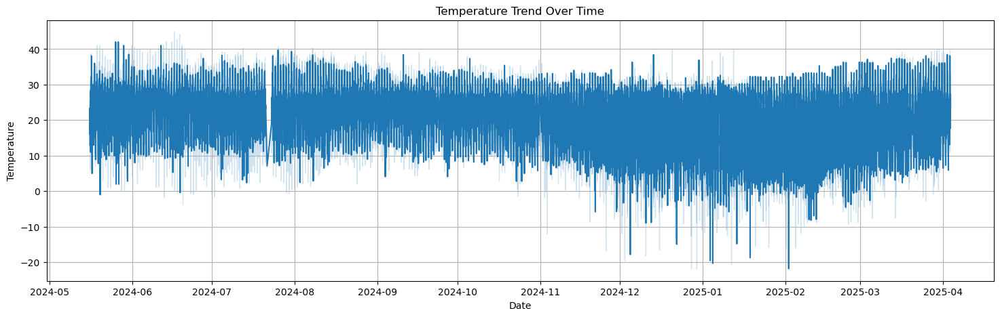

In [24]:
# Temperature trend
plt.figure(figsize=(18, 5))
sns.lineplot(data=df, x='last_updated', y='temperature_celsius')
plt.title('Temperature Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

In [25]:
cities = df['location_name'].head(5).values
print(cities)

['Washington Park' 'Mexico City' 'Tegucigalpa' 'San Salvador' 'San Juan']


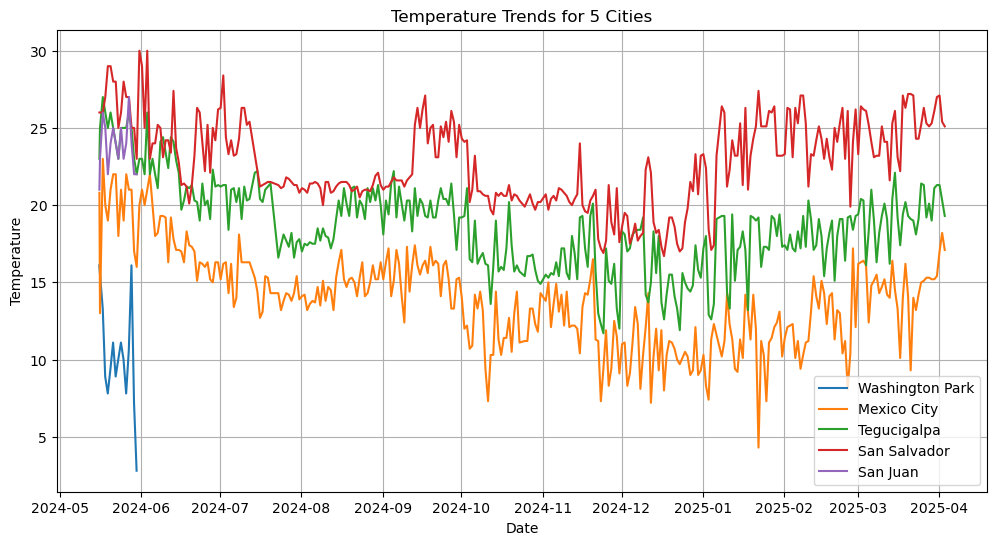

In [26]:
plt.figure(figsize=(12, 6))
for city in cities:
    city_data = df[df['location_name'] == city]
    sns.lineplot(data=city_data, x='last_updated', y='temperature_celsius', label=city)

plt.title('Temperature Trends for 5 Cities')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()

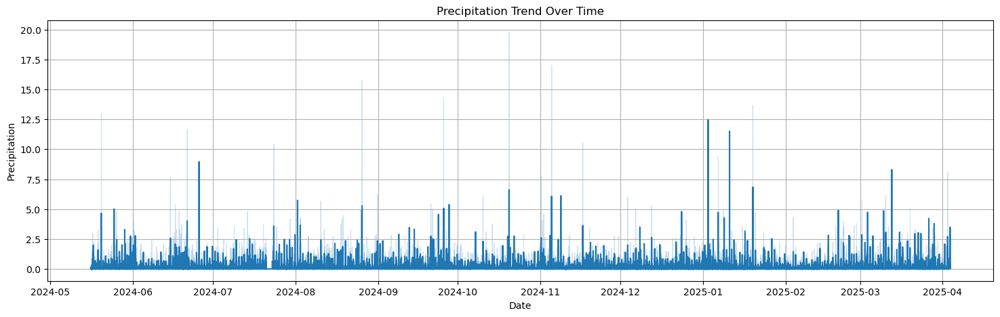

In [27]:
# Precipitation histogram
plt.figure(figsize=(18, 5))
sns.lineplot(data=df, x='last_updated', y='precip_mm')
plt.title('Precipitation Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Precipitation')
plt.grid(True)
plt.show()

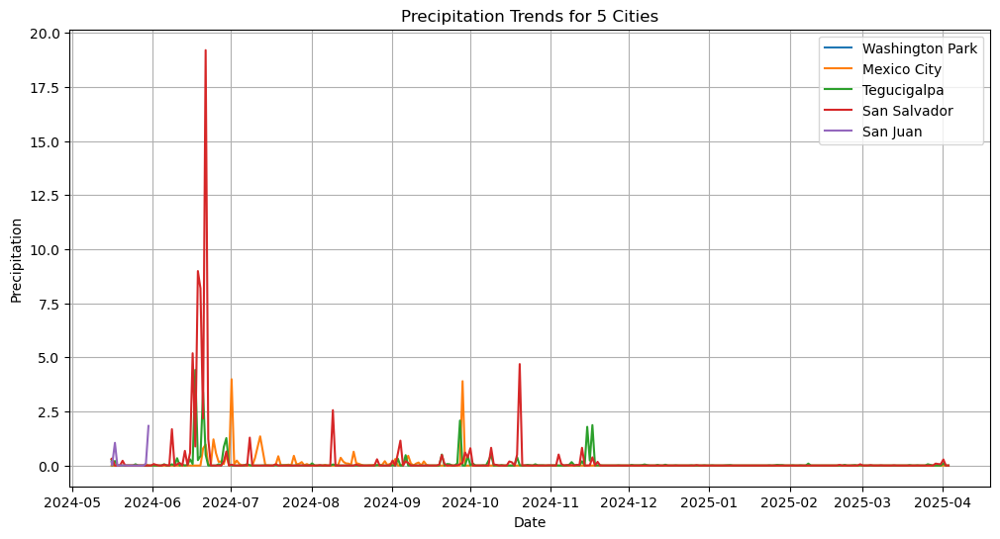

In [28]:
plt.figure(figsize=(12, 6))
for city in cities:
    city_data = df[df['location_name'] == city]
    sns.lineplot(data=city_data, x='last_updated', y='precip_mm', label=city)

plt.title('Precipitation Trends for 5 Cities')
plt.xlabel('Date')
plt.ylabel('Precipitation')
plt.legend()
plt.grid(True)
plt.show()

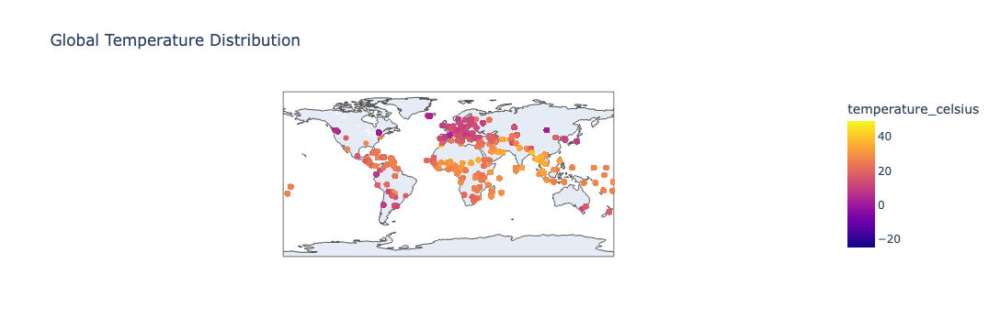

<Figure size 640x480 with 0 Axes>

In [29]:
# Spatial Analysis for Temperature
if 'latitude' in df.columns and 'longitude' in df.columns:
    fig = px.scatter_geo(df, lat='latitude', lon='longitude', color='temperature_celsius',
                         title='Global Temperature Distribution')
    fig.show()

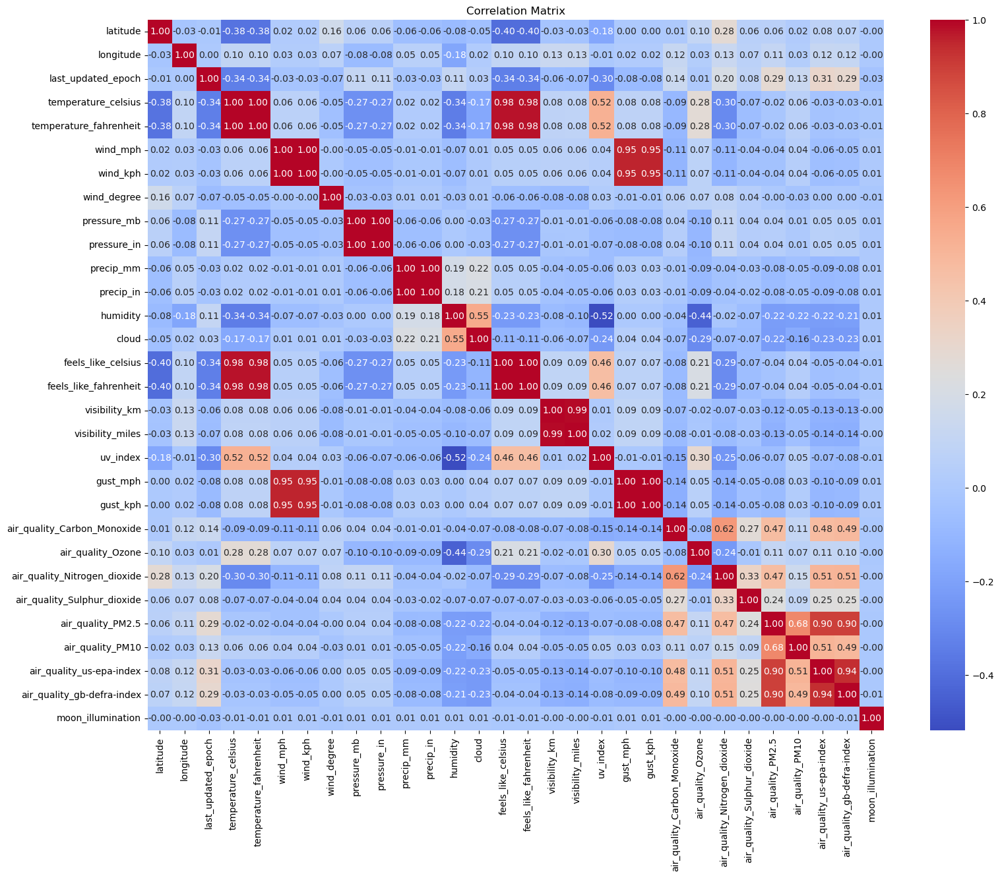

In [30]:
# Select specific columns
corr = df.select_dtypes(include='number').corr()

# Plot heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

## Basic Forecasting Model

### Forecasting Temperature using ARIMA Model

In [33]:
# Forecasting temperature
series = df['temperature_celsius']

In [34]:
# Split data
train, test = series[:-30], series[-30:]

In [35]:
df.set_index('last_updated', inplace=True)

In [66]:
model = auto_arima(train,
                   seasonal=False,  
                   stepwise=False,
                   suppress_warnings=True,
                   trace=True)
print(model.summary())

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=478532.388, Time=0.84 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=442404.804, Time=3.98 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=442313.606, Time=6.02 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=442232.386, Time=11.33 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=442179.570, Time=13.92 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=442161.652, Time=22.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=461195.572, Time=0.89 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=442305.670, Time=6.40 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=441921.808, Time=33.83 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=442312.899, Time=11.54 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=442230.700, Time=13.78 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=454518.085, Time=2.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=442216.066, Time=11.19 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=441668.025, Time=42.50 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AI

In [68]:
# ARIMA model
model = ARIMA(train, order=(2, 1, 1))
model_fit = model.fit()

In [69]:
# Forecast
forecast = model_fit.forecast(steps=30)

In [70]:
# Evaluation
mse = mean_squared_error(test, forecast)
mae = mean_absolute_error(test, forecast)
rmse = np.sqrt(mse)
r2 = r2_score(test, forecast)

print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Evaluation Metrics:
Mean Absolute Error (MAE): 7.1802
Mean Squared Error (MSE): 74.8606
Root Mean Squared Error (RMSE): 8.6522
R² Score: -0.0563


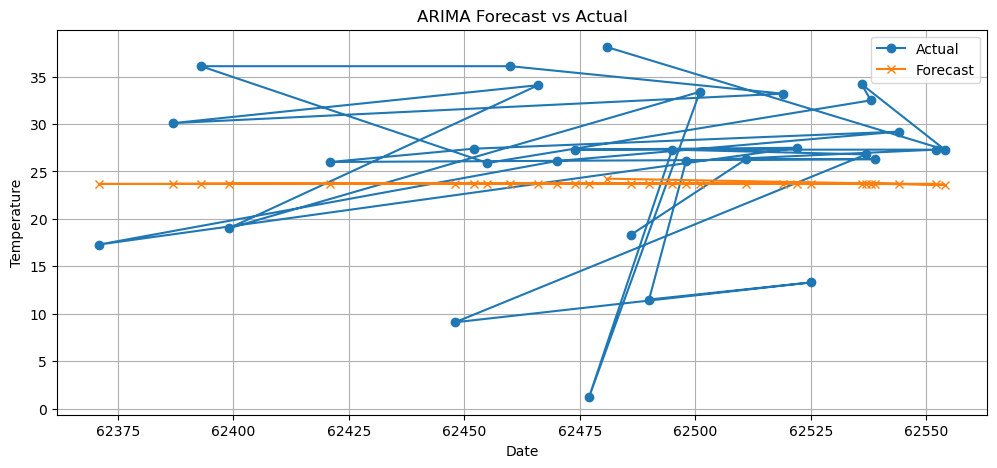

In [71]:
# Plot
plt.figure(figsize=(12, 5))
plt.plot(test.index, test.values, label='Actual', marker='o')
plt.plot(test.index, forecast.values, label='Forecast', marker='x')
plt.title('ARIMA Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()

### Forecasting Temperature using SARIMAX Model

In [73]:
# Resample to monthly average
next_30_days_temp = df['temperature_celsius'].resample('D').mean().tail(30)

In [74]:
model = SARIMAX(next_30_days_temp, 
                order=(2, 1, 2),              # ARIMA terms
                seasonal_order=(1, 1, 1, 30), 
                enforce_stationarity=False, 
                enforce_invertibility=False)
model_fit = model.fit()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -0.00000D+00    |proj g|=  0.00000D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    7      0      1      0     0     0   0.000D+00  -0.000D+00
  F =  -0.0000000000000000     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


In [75]:
# Summary of the model
print(model_fit.summary())

                                      SARIMAX Results                                       
Dep. Variable:                  temperature_celsius   No. Observations:                   30
Model:             SARIMAX(2, 1, 2)x(1, 1, [1], 30)   Log Likelihood                   0.000
Date:                              Fri, 13 Jun 2025   AIC                             14.000
Time:                                      01:41:50   BIC                                nan
Sample:                                  03-05-2025   HQIC                               nan
                                       - 04-03-2025                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1               0         -0        nan        nan           0           0
ar.L2              

In [76]:
# Forecast
forecast = model_fit.get_forecast(steps=30)
forecast_mean = forecast.predicted_mean
conf_int = forecast.conf_int()

In [77]:
# Evaluation
mae = mean_absolute_error(test, forecast_mean)
mse = mean_squared_error(test, forecast_mean)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

Mean Absolute Error (MAE): 9.889688599674672
Mean Squared Error (MSE): 163.17344686096814
Root Mean Squared Error (RMSE): 12.773936232069117


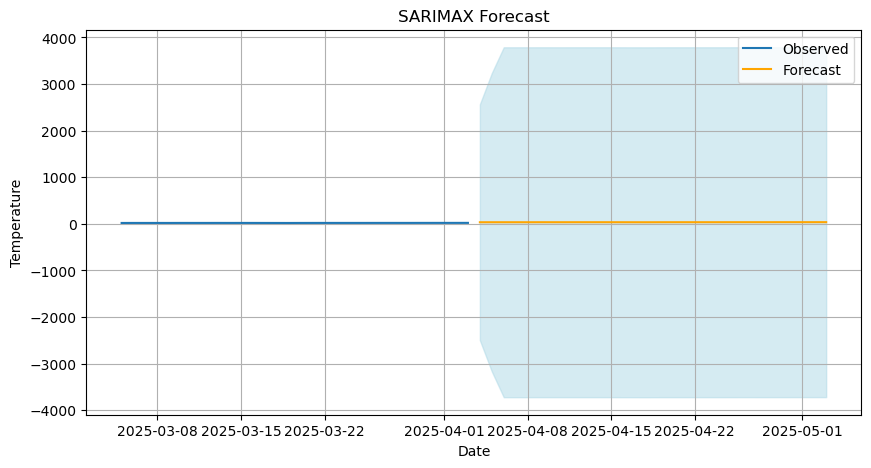

In [78]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(next_30_days_temp, label='Observed')
plt.plot(forecast_mean, label='Forecast', color='orange')
plt.fill_between(conf_int.index, 
                 conf_int.iloc[:, 0], 
                 conf_int.iloc[:, 1], 
                 color='lightblue', alpha=0.5)
plt.legend()
plt.title('SARIMAX Forecast')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.grid(True)
plt.show()

### Forecasting Temperature using Facebook Prophet Model

In [80]:
# Prophet requires columns named 'ds' for date and 'y' for target
df_prophet = df.rename(columns={'temperature_celsius': 'y'})
df_prophet['ds'] = df.index
# df_prophet['y'] = df['temperature_celsius']

In [81]:
# Train-test split (last 30 days as test)
train = df_prophet[:-30]
test = df_prophet[-30:]

In [82]:
# Initialize and fit the model
model = Prophet(daily_seasonality=True)
model.fit(train)

01:41:51 - cmdstanpy - INFO - Chain [1] start processing
01:41:59 - cmdstanpy - INFO - Chain [1] done processing


In [83]:
# Create future dataframe
future = model.make_future_dataframe(periods=30)
forecast = model.predict(future)

In [84]:
# Evaluation

# Get the last 30 predicted values to compare with test
forecast_tail = forecast[['ds', 'yhat']].tail(30)
test.reset_index(drop=True, inplace=True)

# Calculate metrics
mae = mean_absolute_error(test['y'], forecast_tail['yhat'])
mse = mean_squared_error(test['y'], forecast_tail['yhat'])
rmse = np.sqrt(mse)
r2 = r2_score(test['y'], forecast_tail['yhat'])

print("Evaluation Metrics:")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Evaluation Metrics:
MAE: 6.5060
MSE: 75.1458
RMSE: 8.6687
R² Score: -0.0603


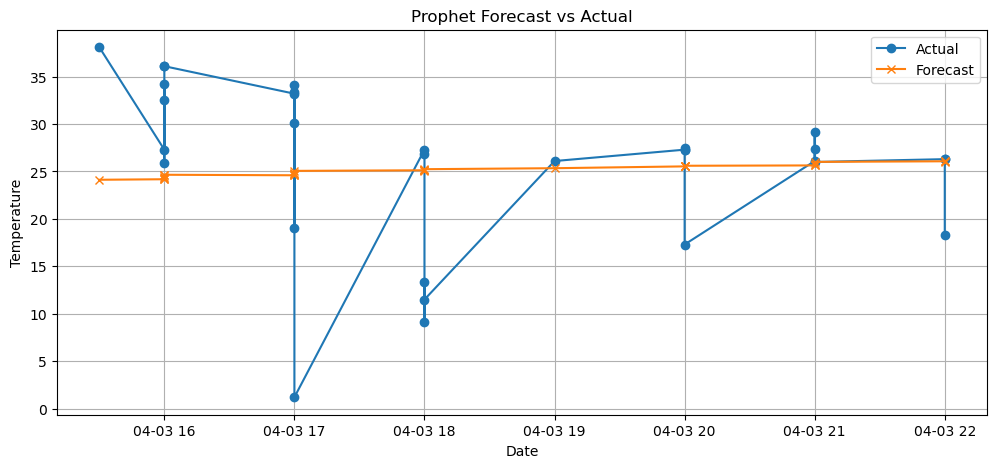

In [85]:
# Plot actual vs predicted
plt.figure(figsize=(12, 5))
plt.plot(test['ds'], test['y'], label='Actual', marker='o')
plt.plot(test['ds'], forecast_tail['yhat'], label='Forecast', marker='x')
plt.title('Prophet Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()

### Forecasting Temperature using XGBoost Regressor Model

In [87]:
# Feature Engineering
df['last_updated'] = df.index
df['year'] = df['last_updated'].dt.year
df['month'] = df['last_updated'].dt.month
df['day'] = df['last_updated'].dt.day
df['dayofweek'] = df['last_updated'].dt.dayofweek
df['weekofyear'] = df['last_updated'].dt.isocalendar().week.astype(int)

In [88]:
# Drop original datetime
features = ['year', 'month', 'day', 'dayofweek', 'weekofyear']
X = df[features]
y = df['temperature_celsius']

In [89]:
# Train-test split
X_train, X_test = X[:-30], X[-30:]
y_train, y_test = y[:-30], y[-30:]

In [90]:
# Train XGBoost Regressor
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, ...)

In [91]:
# Predict
y_pred = model.predict(X_test)

In [92]:
# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Evaluation Metrics:")
print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

Evaluation Metrics:
MAE: 8.8112
MSE: 97.3902
RMSE: 9.8686
R² Score: -0.3742


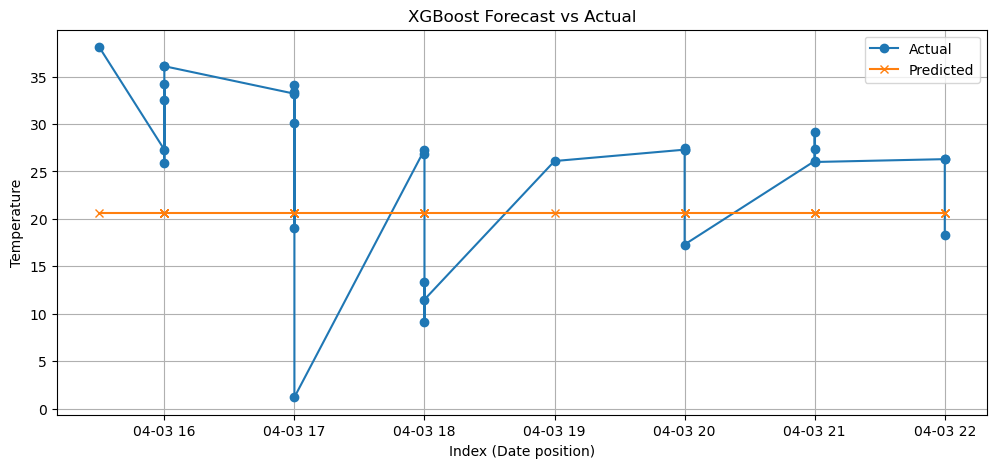

In [93]:
# Plot actual vs predicted
plt.figure(figsize=(12, 5))
plt.plot(y_test.index, y_test.values, label='Actual', marker='o')
plt.plot(y_test.index, y_pred, label='Predicted', marker='x')
plt.title('XGBoost Forecast vs Actual')
plt.xlabel('Index (Date position)')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()

#### Tuning XGBoost Regressor

In [95]:
# Feature Engineering
df_ml = df.copy()
df_ml['last_updated'] = df.index
df_ml['month'] = df.index.month
df_ml['dayofweek'] = df.index.dayofweek
df_ml['dayofyear'] = df.index.dayofyear
df_ml['temp_lag1'] = df.groupby('location_name')['temperature_celsius'].shift(1)
df_ml['temp_lag2'] = df.groupby('location_name')['temperature_celsius'].shift(2)
df_ml['rolling_mean_3'] = df.groupby('location_name')['temperature_celsius'].transform(lambda x: x.rolling(3).mean())

df_ml.dropna(inplace=True)

In [96]:
# Features and target
X = df_ml.drop(columns=['temperature_celsius'])
y = df_ml['temperature_celsius']

In [97]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [98]:
# Hyperparameter tuning with RandomizedSearchCV
params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

In [99]:
# For both training and testing data
X_train = X_train.select_dtypes(exclude=['object', 'datetime64[ns]'])
X_test = X_test.select_dtypes(exclude=['object', 'datetime64[ns]'])

In [100]:
xgb = XGBRegressor(objective='reg:squarederror', random_state=42)

# search = RandomizedSearchCV(xgb, params, scoring='neg_mean_absolute_error', cv=3, verbose=1)
# search.fit(X_train, y_train)

from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3)
search = RandomizedSearchCV(xgb, params, scoring='neg_mean_absolute_error', cv=tscv, verbose=1)
search.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=None),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamm...
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None, ...),
                   param_distributions={'colsample_bytree': [0.7, 0.8, 1.0],
                                        'learning_rate': [0.01, 0.05, 0.1],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.7, 0.8, 1.0]},
                   scoring='neg_mean_absolute_error', verbose=1)

In [101]:
# Best model
best_xgb = search.best_estimator_
y_pred = best_xgb.predict(X_test)

In [102]:
# Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² Score: {r2:.4f}")

MAE: 0.0990
MSE: 0.2358
RMSE: 0.4856
R² Score: 0.9978


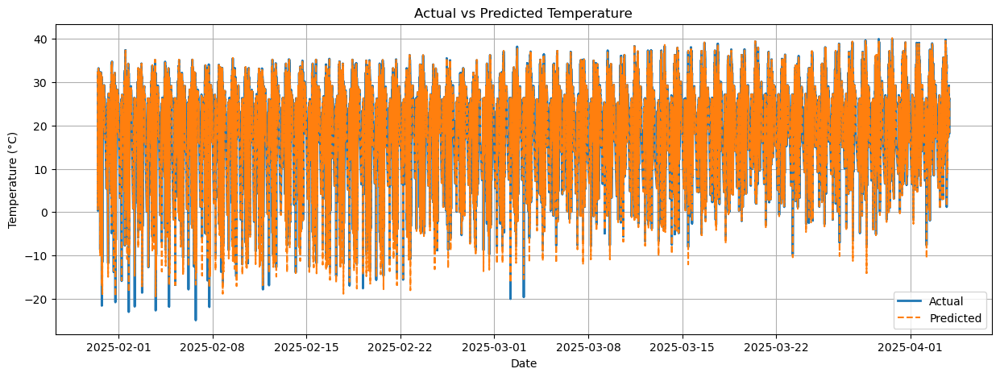

In [103]:
# Plot
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test.values, label='Actual', linewidth=2)
plt.plot(y_test.index, y_pred, label='Predicted', linestyle='--')
plt.legend()
plt.title('Actual vs Predicted Temperature')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.grid(True)
plt.show()